In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn import preprocessing

plt.rc('figure',figsize=(18,9))

from imblearn.over_sampling import SMOTE

In [2]:
df = pd.read_csv('../data/MMM_data.csv')

In [7]:
df.head(20)

,wk_strt_dt,yr_nbr,qtr_nbr,prd,wk_nbr,wk_in_yr_nbr,mdip_dm,mdip_inst,mdip_nsp,mdip_auddig,...,seas_prd_12,seas_week_40,seas_week_41,seas_week_42,seas_week_43,seas_week_44,seas_week_45,seas_week_46,seas_week_47,seas_week_48
0,2014-08-03,2014,3,7,1,27,4863885,29087520,2421933,692315,...,0,0,0,0,0,0,0,0,0,0
1,2014-08-10,2014,3,7,2,28,20887502,8345120,3984494,475810,...,0,0,0,0,0,0,0,0,0,0
2,2014-08-17,2014,3,7,3,29,11097724,17276800,1846832,784732,...,0,0,0,0,0,0,0,0,0,0
3,2014-08-24,2014,3,7,4,30,1023446,18468480,2394834,1032301,...,0,0,0,0,0,0,0,0,0,0
4,2014-08-31,2014,3,8,1,31,21109811,26659920,3312008,400456,...,0,0,0,0,0,0,0,0,0,0
5,2014-09-07,2014,3,8,2,32,5965633,6255666,3215276,461272,...,0,0,0,0,0,0,0,0,0,0
6,2014-09-14,2014,3,8,3,33,10034343,4232000,1365872,497614,...,0,0,0,0,0,0,0,0,0,0
7,2014-09-21,2014,3,8,4,34,12764686,15474013,2024228,270547,...,0,0,0,0,0,0,0,0,0,0
8,2014-09-28,2014,3,8,5,35,11745748,7490000,1715439,294330,...,0,0,0,0,0,0,0,0,0,0
9,2014-10-05,2014,3,9,1,36,1745214,22230560,1840733,849692,...,0,0,0,0,0,0,0,0,0,0


In [27]:
df.dtypes

wk_strt_dt      object
yr_nbr           int64
qtr_nbr          int64
prd              int64
wk_nbr           int64
                 ...  
seas_week_44     int64
seas_week_45     int64
seas_week_46     int64
seas_week_47     int64
seas_week_48     int64
Length: 80, dtype: object

In [28]:
df.shape

(209, 80)

Dimensionalidad de los datos: 209 filas por 80 columnas

Analisis de datos duplicados

In [32]:
print(df.shape[0], 'filas,', df.drop_duplicates().shape[0],
      'distintas entradas ->',
      str(df.shape[0]-df.drop_duplicates().shape[0]),
      'duplicadas.')

209 filas, 209 distintas entradas -> 0 duplicadas.


In [33]:
df.describe()

,yr_nbr,qtr_nbr,prd,wk_nbr,wk_in_yr_nbr,mdip_dm,mdip_inst,mdip_nsp,mdip_auddig,mdip_audtr,...,seas_prd_12,seas_week_40,seas_week_41,seas_week_42,seas_week_43,seas_week_44,seas_week_45,seas_week_46,seas_week_47,seas_week_48
count,209.000000,209.000000,209.000000,209.000000,209.000000,2.090000e+02,2.090000e+02,2.090000e+02,2.090000e+02,2.090000e+02,...,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000
mean,2016.004785,2.507177,6.526316,2.703349,26.626794,9.544510e+06,1.247717e+07,1.616957e+06,1.002816e+06,2.295103e+07,...,0.081340,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139
std,1.226697,1.122838,3.465562,1.274015,15.119856,8.293082e+06,1.024959e+07,2.203341e+06,8.122848e+05,1.567124e+07,...,0.274012,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342
min,2014.000000,1.000000,1.000000,1.000000,1.000000,0.000000e+00,4.853300e+04,0.000000e+00,1.561800e+04,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2015.000000,2.000000,4.000000,2.000000,14.000000,2.087021e+06,5.304240e+06,2.542340e+05,4.577220e+05,1.236705e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2016.000000,3.000000,7.000000,3.000000,27.000000,7.664954e+06,8.911466e+06,8.870720e+05,8.061170e+05,1.910160e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2017.000000,4.000000,10.000000,4.000000,40.000000,1.533852e+07,1.786920e+07,2.248483e+06,1.344765e+06,2.956004e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2018.000000,4.000000,12.000000,5.000000,53.000000,3.979871e+07,6.545146e+07,1.553181e+07,5.418819e+06,9.066538e+07,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


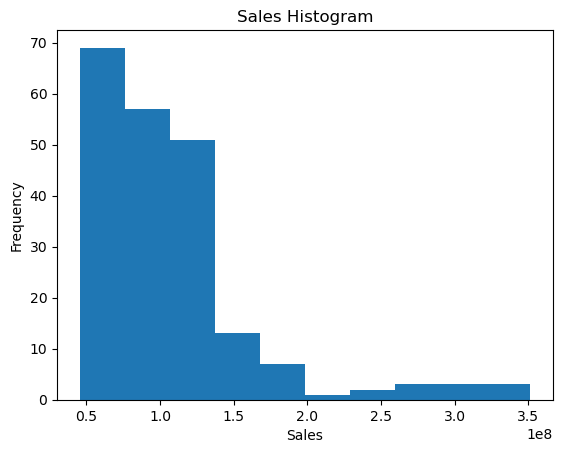

In [36]:
plt.hist(df.sales, bins=10)

# set title and axis labels
plt.title("Sales Histogram")
plt.xlabel("Sales")
plt.ylabel("Frequency")

# display histogram
plt.show()

(<Figure size 1600x400 with 1 Axes>, <AxesSubplot:ylabel='sales'>)

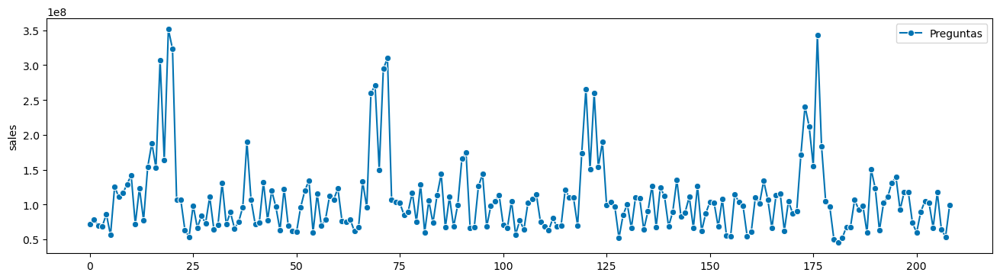

In [42]:
plot_series(df.sales.astype('float64'), labels=["Preguntas"])



In [9]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['sales'],name='Sales Box Plot',boxmean=True)
tr2=go.Histogram(x=df['sales'],name='Sales Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Sales")
fig.show()

In [10]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                 [0.8888888888888888, "rgb(215,48,39)"],
                 [0.7777777777777778, "rgb(244,109,67)"],
                 [0.6666666666666666, "rgb(253,174,97)"],
                 [0.5555555555555556, "rgb(254,224,144)"],
                 [0.4444444444444444, "rgb(224,243,248)"],
                 [0.3333333333333333, "rgb(171,217,233)"],
                 [0.2222222222222222, "rgb(116,173,209)"],
                 [0.1111111111111111, "rgb(69,117,180)"],
                 [0.0               , "rgb(49,54,149)"]]

s_val =df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
      go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),
      row=1, col=1
)


s_val =df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
      go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=0.7,ygap=0.7,colorscale=colorscale),
      row=2, col=1
)
fig.update_layout(
      hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell"
      )
)
fig.update_layout(height=700, width=900, title_text="Numeric Correaltions")
fig.show()

C:\Users\ALBERT~1\AppData\Local\Temp/ipykernel_26600/2241958922.py:13: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

C:\Users\ALBERT~1\AppData\Local\Temp/ipykernel_26600/2241958922.py:23: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [13]:
oversample = SMOTE()
X, y = oversample.fit_resample(df[df.columns[1:]], df[df.columns[0]])
usampled_df = X.assign(sales = y)

In [14]:
ohe_data =usampled_df[usampled_df.columns[15:-1]].copy()

usampled_df = usampled_df.drop(columns=usampled_df.columns[15:-1])

In [ ]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                 [0.8888888888888888, "rgb(215,48,39)"],
                 [0.7777777777777778, "rgb(244,109,67)"],
                 [0.6666666666666666, "rgb(253,174,97)"],
                 [0.5555555555555556, "rgb(254,224,144)"],
                 [0.4444444444444444, "rgb(224,243,248)"],
                 [0.3333333333333333, "rgb(171,217,233)"],
                 [0.2222222222222222, "rgb(116,173,209)"],
                 [0.1111111111111111, "rgb(69,117,180)"],
                 [0.0               , "rgb(49,54,149)"]]

s_val =usampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
      go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
      row=1, col=1
)


s_val =usampled_df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
      go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
      row=2, col=1
)
fig.update_layout(
      hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell"
      )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()

In [10]:
pd_null_columnas = pd.DataFrame(df.isnull().sum().sort_values(ascending=False), columns=['nulos_columnas'])
pd_null_filas = pd.DataFrame(df.isnull().sum(axis=1).sort_values(ascending=False), columns=['nulos_filas'])
pd_null_columnas['Proporcion_columnas'] = pd_null_columnas['nulos_columnas']/df.shape[0]
pd_null_filas['Proporcion_filas']= pd_null_filas['nulos_filas']/df.shape[1]
print(pd_null_filas)
print(pd_null_columnas)

     nulos_filas  Proporcion_filas
0              0               0.0
105            0               0.0
133            0               0.0
134            0               0.0
135            0               0.0
..           ...               ...
73             0               0.0
74             0               0.0
75             0               0.0
76             0               0.0
208            0               0.0

[209 rows x 2 columns]
                     nulos_columnas  Proporcion_columnas
wk_strt_dt                        0                  0.0
yr_nbr                            0                  0.0
hldy_Thanksgiving                 0                  0.0
hldy_Prime Day                    0                  0.0
hldy_Presidents Day               0                  0.0
...                             ...                  ...
mdsp_viddig                       0                  0.0
mdsp_vidtr                        0                  0.0
mdsp_audtr                        0        

Estandarizar Ventas, Impresiones e Inversión en publicidad

In [3]:
df2=df.iloc[:,6:30]

In [9]:
df2.dtypes

mdip_dm          int64
mdip_inst        int64
mdip_nsp         int64
mdip_auddig      int64
mdip_audtr       int64
mdip_vidtr       int64
mdip_viddig      int64
mdip_so          int64
mdip_on          int64
mdip_em          int64
mdip_sms         int64
mdip_aff         int64
mdip_sem         int64
mdsp_dm        float64
mdsp_inst      float64
mdsp_nsp       float64
mdsp_auddig    float64
mdsp_audtr     float64
mdsp_vidtr     float64
mdsp_viddig    float64
mdsp_so        float64
mdsp_on        float64
mdsp_sem       float64
sales          float64
dtype: object

In [4]:
x = df2.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_scaled = pd.DataFrame(x_scaled, columns= df2.columns)

In [11]:
df_scaled

,mdip_dm,mdip_inst,mdip_nsp,mdip_auddig,mdip_audtr,mdip_vidtr,mdip_viddig,mdip_so,mdip_on,mdip_em,...,mdsp_inst,mdsp_nsp,mdsp_auddig,mdsp_audtr,mdsp_vidtr,mdsp_viddig,mdsp_so,mdsp_on,mdsp_sem,sales
0,0.122212,0.444001,0.155934,0.125240,0.416676,0.152496,0.195687,0.000000,0.205944,0.009496,...,0.218368,0.230904,0.206616,0.583392,0.197008,0.435044,0.000000,0.032102,0.053222,0.087289
1,0.524829,0.126853,0.256538,0.085170,0.133057,0.149598,0.054428,0.000000,0.279575,0.109922,...,0.117514,0.284616,0.385643,0.244719,0.099010,0.027823,0.000000,0.140854,0.046527,0.109306
2,0.278846,0.263417,0.118906,0.142344,0.063642,0.109910,0.094145,0.000000,0.290383,0.023759,...,0.180951,0.126239,0.199745,0.135467,0.067297,0.077722,0.000000,0.055562,0.049417,0.080823
3,0.025716,0.281638,0.154189,0.188163,0.134274,0.131022,0.199214,0.000000,0.456461,0.062964,...,0.238655,0.084617,0.461700,0.408642,0.100897,0.062444,0.000000,0.233008,0.056473,0.076159
4,0.530414,0.406884,0.213240,0.071224,0.349153,0.300559,0.223268,0.000000,0.286050,0.156602,...,0.270883,0.321449,0.396970,0.330791,0.204658,0.185728,0.000000,0.319317,0.068840,0.133453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,0.000328,0.210689,0.000025,0.392270,0.197971,0.198989,0.028033,0.288458,0.500378,0.320057,...,0.066366,0.000113,0.275474,0.187390,0.097188,0.054607,0.222288,0.498623,0.296371,0.069873
205,0.000000,0.056049,0.000000,0.265188,0.412005,0.165644,0.099471,0.209350,0.223063,0.914356,...,0.051734,0.000000,0.491907,0.248736,0.035343,0.138073,0.089640,0.289275,0.232643,0.235448
206,0.055909,0.077272,0.000000,0.239145,0.301990,0.147189,0.048822,0.232829,0.239275,0.464437,...,0.073790,0.000000,0.175027,0.317393,0.053143,0.093821,0.216091,0.163754,0.183065,0.061127
207,0.440827,0.021865,0.000122,0.091598,0.093870,0.104212,0.007455,0.381079,0.193951,0.607683,...,0.024110,0.000257,0.071823,0.154347,0.012631,0.009962,0.237998,0.156976,0.104953,0.026946


In [39]:
df_scaled.dtypes

mdip_dm        float64
mdip_inst      float64
mdip_nsp       float64
mdip_auddig    float64
mdip_audtr     float64
mdip_vidtr     float64
mdip_viddig    float64
mdip_so        float64
mdip_on        float64
mdip_em        float64
mdip_sms       float64
mdip_aff       float64
mdip_sem       float64
mdsp_dm        float64
mdsp_inst      float64
mdsp_nsp       float64
mdsp_auddig    float64
mdsp_audtr     float64
mdsp_vidtr     float64
mdsp_viddig    float64
mdsp_so        float64
mdsp_on        float64
mdsp_sem       float64
sales          float64
dtype: object

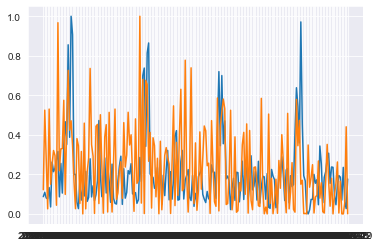

In [40]:
plt.plot(df.wk_strt_dt, df_scaled.sales)
plt.plot(df.wk_strt_dt, df_scaled.mdip_dm)

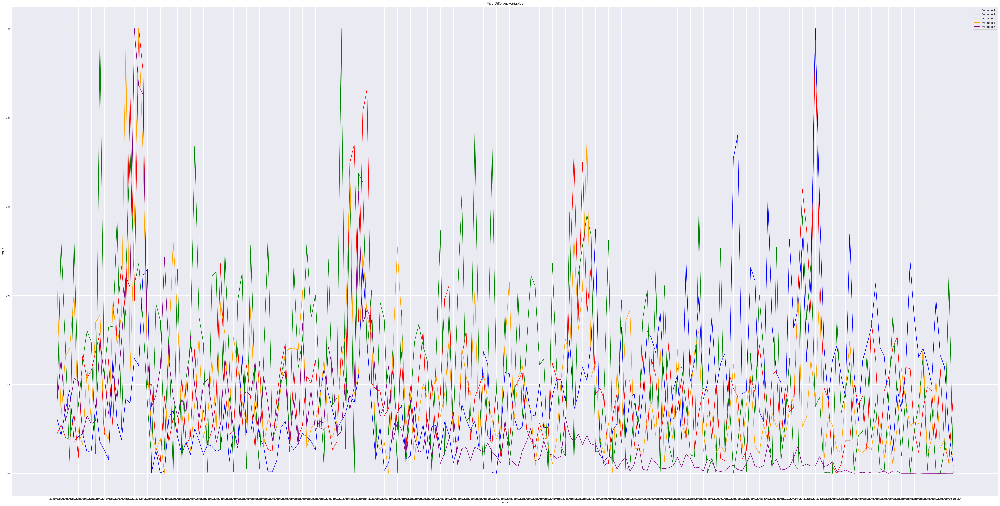

In [22]:


# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))

ax.plot(df.wk_strt_dt, df_scaled.mdip_auddig, color='blue', label='Variable 1')
ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')
ax.plot(df.wk_strt_dt, df_scaled.mdip_dm, color='green', label='Variable 3')
ax.plot(df.wk_strt_dt, df_scaled.mdip_inst, color='orange', label='Variable 4')
ax.plot(df.wk_strt_dt, df_scaled.mdip_nsp, color='purple', label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()


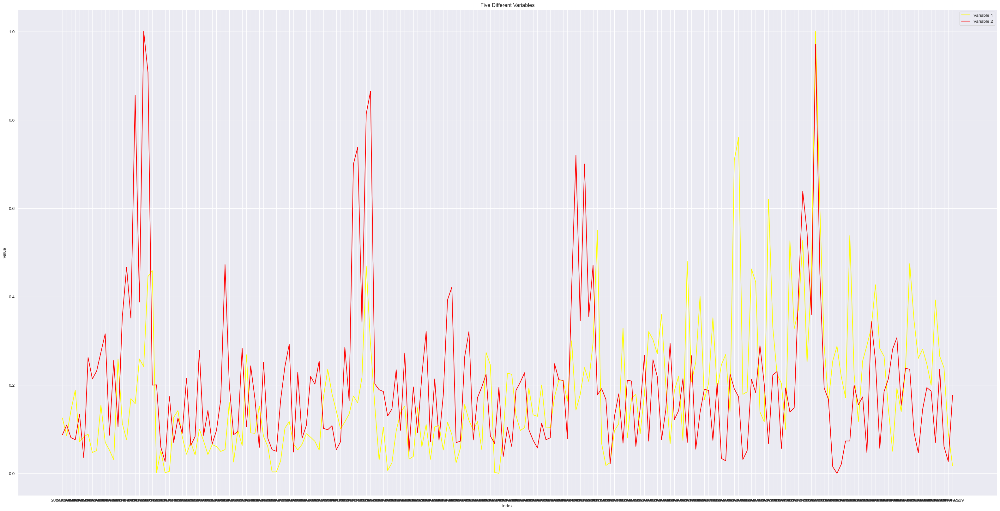

In [24]:

# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(40, 20))

ax.plot(df.wk_strt_dt, df_scaled.mdip_auddig, color='yellow', label='Variable 1')
ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')


# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

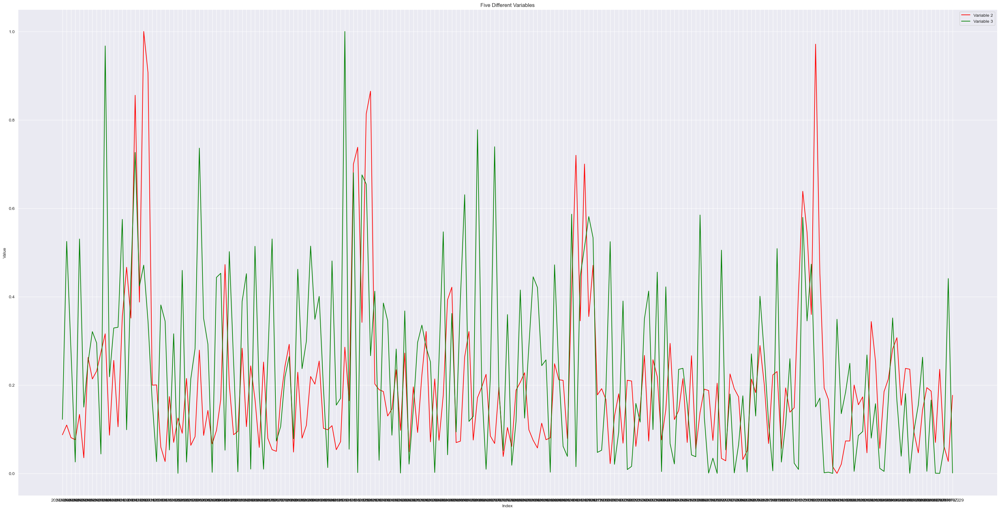

In [26]:

# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(40, 20))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')
ax.plot(df.wk_strt_dt, df_scaled.mdip_dm, color='green', label='Variable 3')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

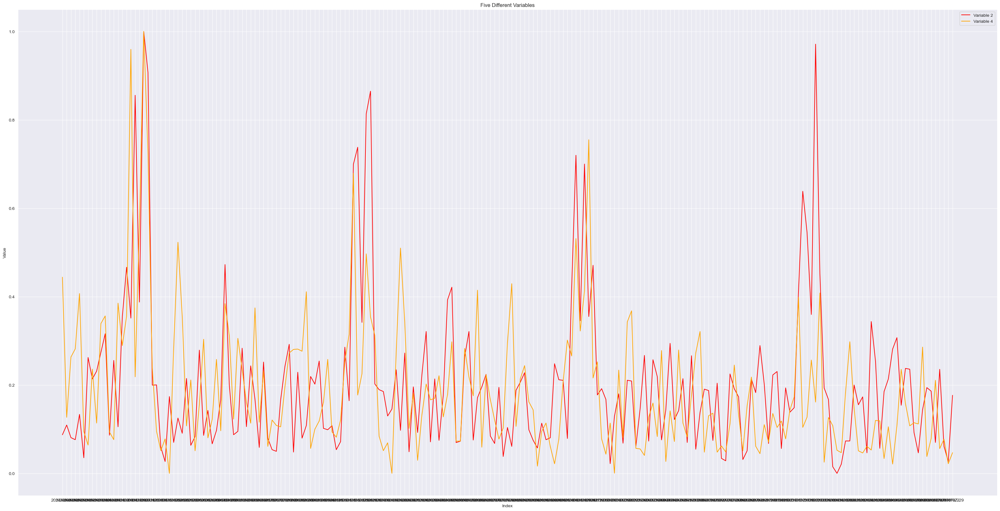

In [27]:

# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(40, 20))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_inst, color='orange', label='Variable 4')


# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

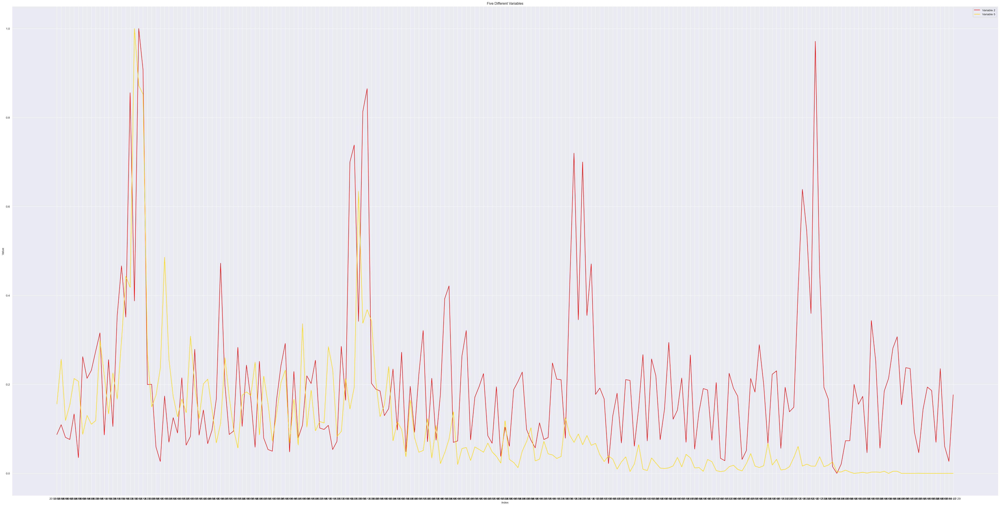

In [33]:

# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_nsp, color=(1.0, 0.8571428571428571, 0.0), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

In [30]:
import colorsys

# Number of colors to generate
num_colors = 7

# List to store the colors
super_bright_colors = []

# Generate colors with maximum saturation and value
for i in range(num_colors):
    hue = i / num_colors  # hue varies from 0 to 1
    saturation = 1.0    # maximum saturation
    value = 1.0         # maximum value
    rgb = colorsys.hsv_to_rgb(hue, saturation, value)
    super_bright_colors.append(rgb)

# Display the colors
print(super_bright_colors)

[(1.0, 0.0, 0.0), (1.0, 0.8571428571428571, 0.0), (0.2857142857142858, 1.0, 0.0), (0.0, 1.0, 0.5714285714285712), (0.0, 0.5714285714285716, 1.0), (0.2857142857142856, 0.0, 1.0), (1.0, 0.0, 0.8571428571428577)]


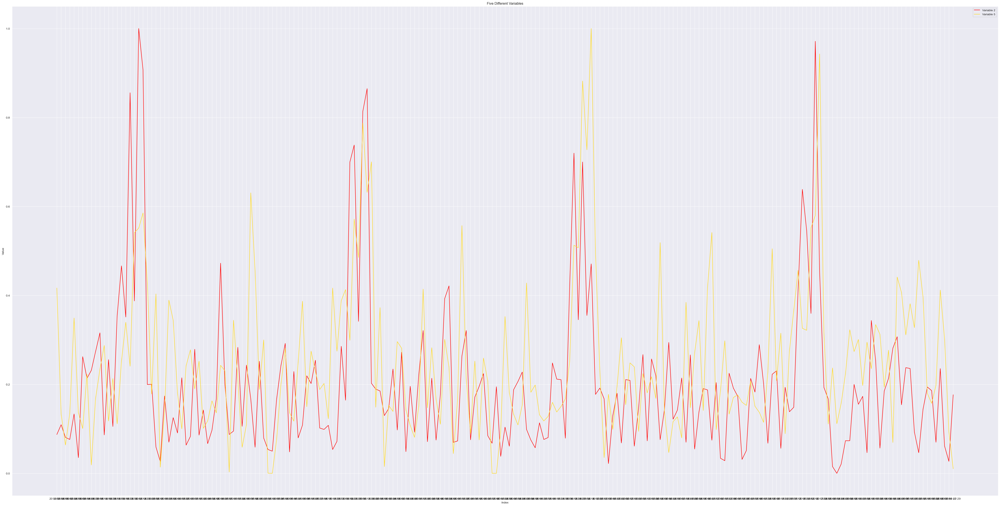

In [40]:
# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_audtr, color=(1.0, 0.8571428571428571, 0.160), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

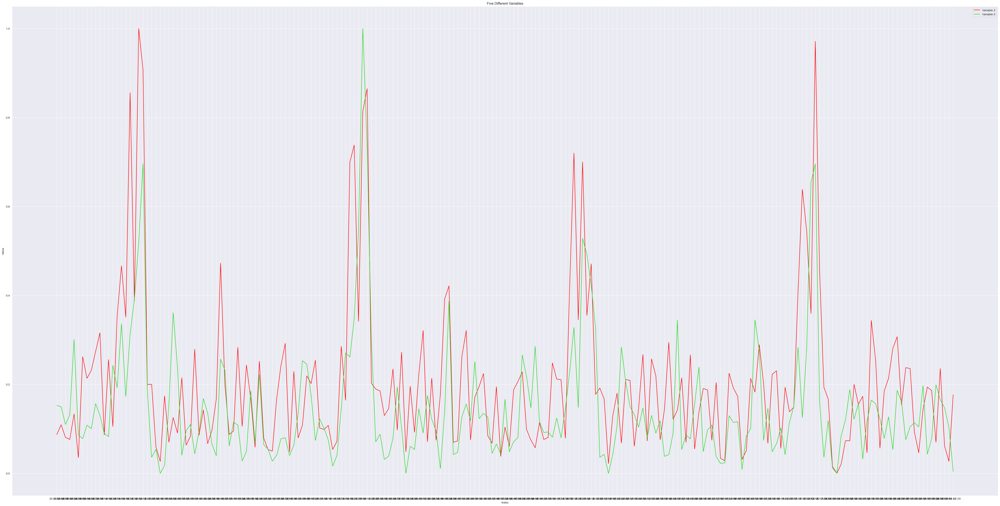

In [42]:
 #Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_vidtr, color=(0.12, 0.8571428571428571, 0.12), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

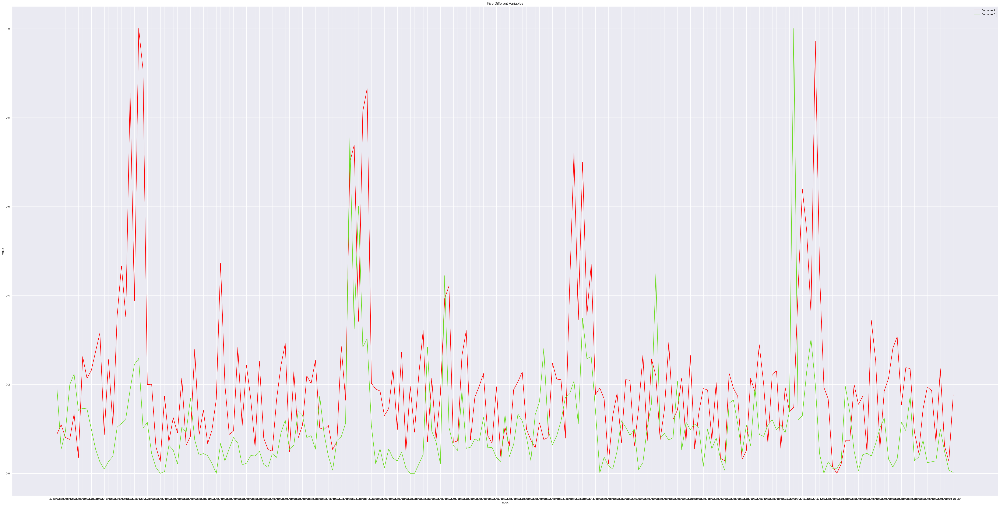

In [44]:
 #Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_viddig, color=(0.42, 0.8571428571428571, 0.12), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

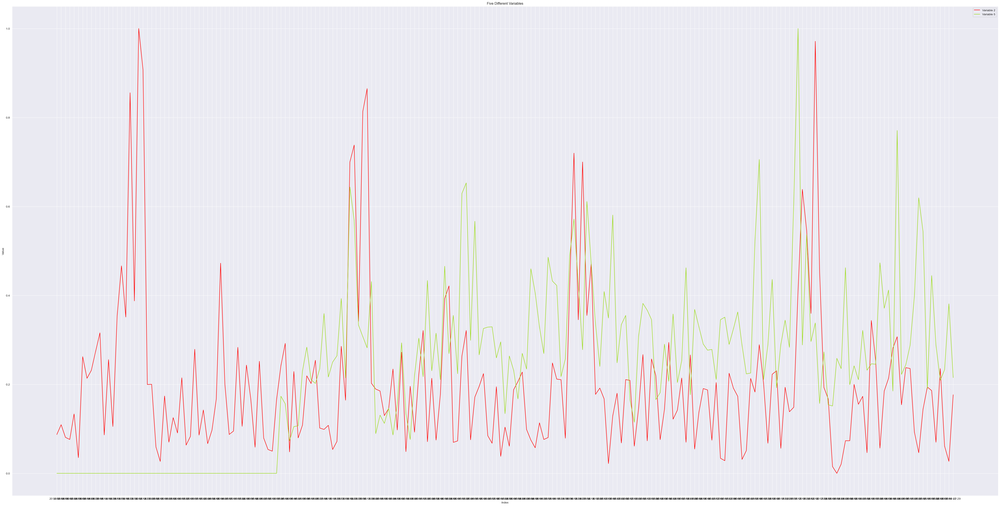

In [45]:
 #Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_so, color=(0.62, 0.8571428571428571, 0.12), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

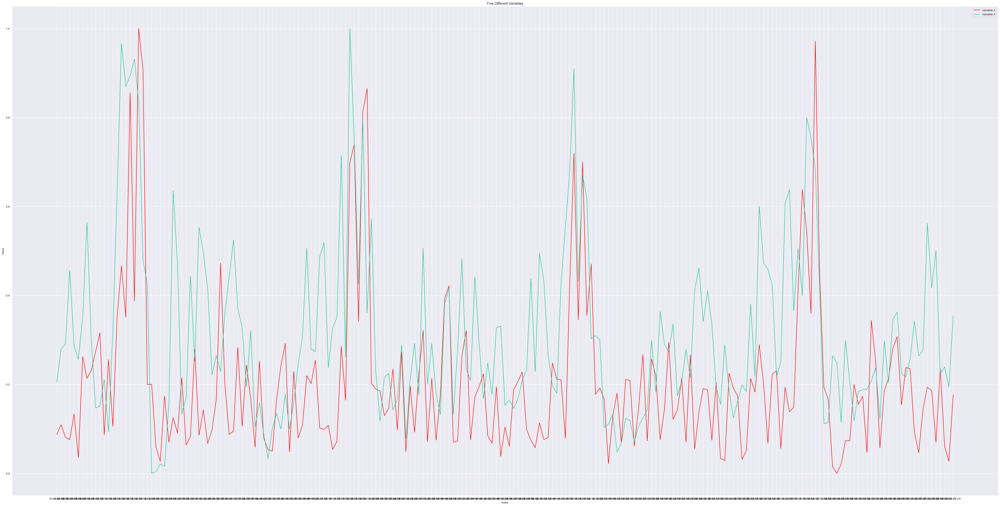

In [46]:
 #Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_on, color=(0.12, 0.8, 0.6), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

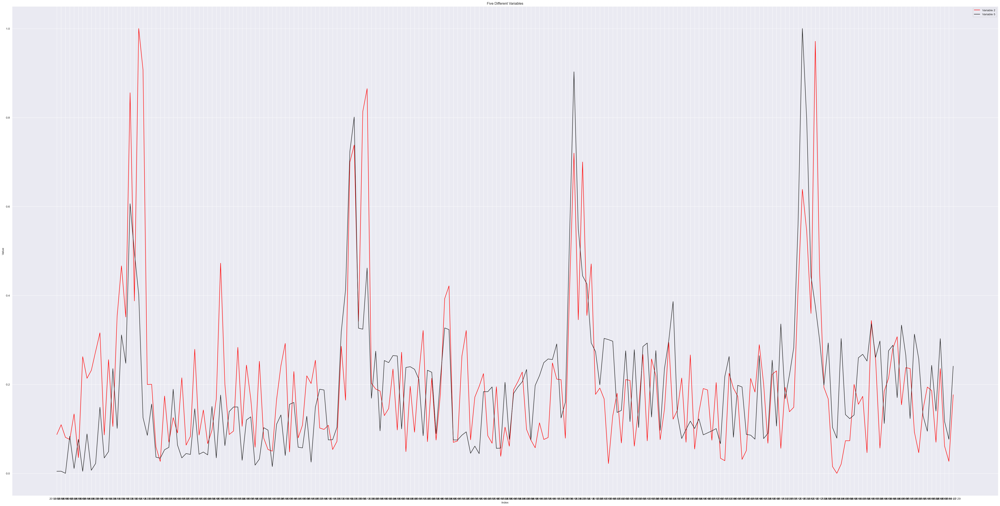

In [47]:
 #Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(60, 30))


ax.plot(df.wk_strt_dt, df_scaled.sales, color='red', label='Variable 2')

ax.plot(df.wk_strt_dt, df_scaled.mdip_sem, color=(0.12, 0.12, 0.12), label='Variable 5')

# Add a legend, title and axis labels
ax.legend()
ax.set_title('Five Different Variables')
ax.set_xlabel('Index')
ax.set_ylabel('Value')

plt.show()

In [9]:
def plot_sales(df, df2, column, date, target):
  fig, ax = plt.subplots(figsize=(60, 30))
  ax.plot(df2[date], df[target], color='red', label='Sales')
  ax.plot(df2[date], df[column], color=(0.12, 0.12, 0.12), label= column)

# Add a legend, title and axis labels
  ax.legend()
  ax.set_title('Five Different Variables')
  ax.set_xlabel('Index')
  ax.set_ylabel('Value')

  plt.show()



In [ ]:
columns = ['mdip_dm','mdip_inst', 'mdip_nsp', 'mdip_auddig', 'mdip_audtr', 'mdip_vidtr', 'mdip_viddig', 'mdip_so', 'mdip_on' ,'mdip_em','mdip_sms','mdip_aff','mdip_sem','mdip_dm','mdip_inst','mdip_nsp','mdip_auddug','mdip_audtr','mdip_vidtr','mdip_viddig','mdip_so','mdip_on','mdsp_sem']

In [1]:
columns = ['mdip_dm','mdip_inst', 'mdip_nsp', 'mdip_auddig', 'mdip_audtr', 'mdip_vidtr', 'mdip_viddig', 'mdip_so', 'mdip_on' ,'mdip_em','mdip_sms','mdip_aff','mdip_sem','mdip_dm','mdip_inst','mdip_nsp','mdip_auddug','mdip_audtr','mdip_vidtr','mdip_viddig','mdip_so','mdip_on','mdsp_sem']
for column in columns:
    plot_sales(df_scaled, df, column,'wk_strt_dt' , 'sales')



NameError: name 'plot_sales' is not defined

In [5]:
df_scaled['sales']

0      0.087289
1      0.109306
2      0.080823
3      0.076159
4      0.133453
         ...   
204    0.069873
205    0.235448
206    0.061127
207    0.026946
208    0.176676
Name: sales, Length: 209, dtype: float64

In [ ]:
def count_outliers(df):
    """
    Función que devuelve el número de filas atípicas para cada variable numérica en un dataframe
    utilizando la regla del rango intercuartil (IQR) ampliado.

    :param df: Un dataframe de Pandas con variables numéricas
    :return: Un diccionario con el número de filas atípicas para cada variable numérica
    """
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = {}
    for col in df.columns:
        outliers[col] = df[(df[col] < lower_bound[col]) | (df[col] > upper_bound[col])].shape[0]
    return outliers

In [ ]:
count_outliers(df[columns])

In [ ]:
def count_outliers(df):
    """
    Función que cuenta el número de outliers y el porcentaje de outliers
    para cada variable en un DataFrame de variables numéricas.

    Parámetros:
    - df: DataFrame con variables numéricas

    Retorna:
    - DataFrame con tres columnas: variable, número de outliers, porcentaje de outliers
    """
    # Calcula los cuartiles
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    iqr = q3 - q1

    # Calcula los límites inferior y superior
    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr

    # Cuenta los outliers para cada variable
    outlier_counts = pd.DataFrame(columns=['variable', 'num_outliers', 'pct_outliers'])
    for col in df.columns:
        num_outliers = len(df[(df[col] < lower_limit[col]) | (df[col] > upper_limit[col])])
        pct_outliers = round(num_outliers / len(df) * 100, 2)
        outlier_counts = outlier_counts.append({'variable': col, 'num_outliers': num_outliers, 'pct_outliers': pct_outliers}, ignore_index=True)

    return outlier_counts

In [ ]:
count_outliers(df[columns])